In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

%matplotlib inline

from time import time
from datetime import datetime, date
import os

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Ruta del archivo CSV en Google Drive
file_path = '/content/drive/MyDrive/IA_Database/2019_Ecomm_Sales_Behavior.csv'

# Cargar el archivo CSV
df = pd.read_csv(file_path)

# Verificar las primeras filas del DataFrame
print(df.head())

   Unnamed: 0.1  Unnamed: 0               event_time event_type  product_id  \
0             0     8122483  2019-10-11 16:57:06 UTC       view        5016   
1             1    21718567  2019-10-27 14:23:53 UTC       view        4240   
2             2    55557455  2019-11-25 12:57:47 UTC       view        7721   
3             3    35824413  2019-11-12 19:50:55 UTC       view         597   
4             4    35993257  2019-11-13 04:59:13 UTC       view       13709   

   category_id                  category_code    brand    price  user_id  \
0          183        appliances.kitchen.oven    artel    36.01  1095536   
1           43           electronics.video.tv       lg  2445.08  1153084   
2          208  appliances.environment.vacuum  philips   257.38   364298   
3           71         electronics.smartphone   huawei   163.20  3536496   
4           70          electronics.telephone    nokia    21.85  3542250   

   user_session  
0       5342766  
1       4600705  
2       599166

In [6]:
df_sales = pd.read_csv(file_path)

In [7]:
df_sales = df_sales.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'])
df_sales.head()

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session
0,2019-10-11 16:57:06 UTC,view,5016,183,appliances.kitchen.oven,artel,36.01,1095536,5342766
1,2019-10-27 14:23:53 UTC,view,4240,43,electronics.video.tv,lg,2445.08,1153084,4600705
2,2019-11-25 12:57:47 UTC,view,7721,208,appliances.environment.vacuum,philips,257.38,364298,5991663
3,2019-11-12 19:50:55 UTC,view,597,71,electronics.smartphone,huawei,163.20,3536496,9397681
4,2019-11-13 04:59:13 UTC,view,13709,70,electronics.telephone,nokia,21.85,3542250,8711820


In [8]:
df_sales['Event_date'] = df_sales.event_time.apply(lambda x: x.split(' ')[0])
df_sales['Event_time'] = df_sales.event_time.apply(lambda x: x.split(' ')[1])
df_sales['Event_timezone'] = df_sales.event_time.apply(lambda x: x.split(' ')[2])

In [9]:
df_sales.head()

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone
0,2019-10-11 16:57:06 UTC,view,5016,183,appliances.kitchen.oven,artel,36.01,1095536,5342766,2019-10-11,16:57:06,UTC
1,2019-10-27 14:23:53 UTC,view,4240,43,electronics.video.tv,lg,2445.08,1153084,4600705,2019-10-27,14:23:53,UTC
2,2019-11-25 12:57:47 UTC,view,7721,208,appliances.environment.vacuum,philips,257.38,364298,5991663,2019-11-25,12:57:47,UTC
3,2019-11-12 19:50:55 UTC,view,597,71,electronics.smartphone,huawei,163.20,3536496,9397681,2019-11-12,19:50:55,UTC
4,2019-11-13 04:59:13 UTC,view,13709,70,electronics.telephone,nokia,21.85,3542250,8711820,2019-11-13,04:59:13,UTC


In [10]:
df_sales['Day_of_Week'] = df_sales.Event_date.apply(lambda x: datetime.strptime(x, '%Y-%m-%d').strftime('%A'))

In [11]:
def check_value(category):
    try:
        sub = category.split('.')[2]
        return True
    except:
        sub = ''
        return False

In [12]:
df_sales['Category'] = df_sales.category_code.apply(lambda x: x.split('.')[0])
df_sales['Sub_category_1'] = df_sales.category_code.apply(lambda x: x.split('.')[1])
df_sales['Sub_category_2'] = df_sales.category_code.apply(lambda x: x.split('.')[2] if check_value(x)
                                                         else x.split('.')[1])

In [13]:
df_sales.head()

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
0,2019-10-11 16:57:06 UTC,view,5016,183,appliances.kitchen.oven,artel,36.01,1095536,5342766,2019-10-11,16:57:06,UTC,Friday,appliances,kitchen,oven
1,2019-10-27 14:23:53 UTC,view,4240,43,electronics.video.tv,lg,2445.08,1153084,4600705,2019-10-27,14:23:53,UTC,Sunday,electronics,video,tv
2,2019-11-25 12:57:47 UTC,view,7721,208,appliances.environment.vacuum,philips,257.38,364298,5991663,2019-11-25,12:57:47,UTC,Monday,appliances,environment,vacuum
3,2019-11-12 19:50:55 UTC,view,597,71,electronics.smartphone,huawei,163.20,3536496,9397681,2019-11-12,19:50:55,UTC,Tuesday,electronics,smartphone,smartphone
4,2019-11-13 04:59:13 UTC,view,13709,70,electronics.telephone,nokia,21.85,3542250,8711820,2019-11-13,04:59:13,UTC,Wednesday,electronics,telephone,telephone


In [14]:
df_sales = df_sales.drop(columns=['event_time','category_code'])
df_sales.head(10)

,event_type,product_id,category_id,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
0,view,5016,183,artel,36.01,1095536,5342766,2019-10-11,16:57:06,UTC,Friday,appliances,kitchen,oven
1,view,4240,43,lg,2445.08,1153084,4600705,2019-10-27,14:23:53,UTC,Sunday,electronics,video,tv
2,view,7721,208,philips,257.38,364298,5991663,2019-11-25,12:57:47,UTC,Monday,appliances,environment,vacuum
3,view,597,71,huawei,163.20,3536496,9397681,2019-11-12,19:50:55,UTC,Tuesday,electronics,smartphone,smartphone
4,view,13709,70,nokia,21.85,3542250,8711820,2019-11-13,04:59:13,UTC,Wednesday,electronics,telephone,telephone
5,view,871,71,apple,958.30,1246770,8667389,2019-11-20,08:00:18,UTC,Wednesday,electronics,smartphone,smartphone
6,view,4152,43,haier,218.77,468520,14436389,2019-11-23,15:05:15,UTC,Saturday,electronics,video,tv
7,purchase,7462,177,samsung,384.80,2388173,12418114,2019-11-17,08:10:32,UTC,Sunday,appliances,kitchen,washer
8,view,5485,182,dauscher,411.40,2382829,11243446,2019-10-21,16:04:19,UTC,Monday,appliances,kitchen,refrigerators
9,view,533,71,xiaomi,177.35,2162691,8112303,2019-11-16,21:24:25,UTC,Saturday,electronics,smartphone,smartphone


In [15]:
brand_list = df_sales.brand.value_counts()
brand_dict = brand_list.to_dict()
brand_dict.keys()

dict_keys(['samsung', 'apple', 'xiaomi', 'huawei', 'lg', 'bosch', 'oppo', 'sony', 'acer', 'artel', 'lenovo', 'respect', 'hp', 'philips', 'redmond', 'indesit', 'dauscher', 'asus', 'vitek', 'casio', 'tefal', 'beko', 'stels', 'brw', 'haier', 'nokia', 'sv', 'midea', 'meizu', 'starline', 'braun', 'janome', 'force', 'vivo', 'hansa', 'karcher', 'bts', 'atlant', 'pulser', 'huter', 'ariston', 'canon', 'arg', 'oneplus', 'epson', 'kivi', 'tcl', 'msi', 'yamaha', 'thomas'])

In [ ]:
#EDA

In [16]:
df_sales.describe()

,product_id,category_id,price,user_id,user_session
count,236000.000000,236000.000000,236000.000000,2.360000e+05,2.360000e+05
mean,5211.558271,94.114797,390.030293,1.587240e+06,7.530784e+06
std,6334.376969,55.245882,382.386132,1.136710e+06,4.347473e+06
min,1.000000,0.000000,1.260000,9.900000e+01,1.500000e+01
25%,707.000000,71.000000,135.010000,5.734125e+05,3.758475e+06
50%,1197.000000,71.000000,249.660000,1.409442e+06,7.543186e+06
75%,7813.000000,115.000000,501.920000,2.461314e+06,1.129546e+07
max,26295.000000,305.000000,2574.040000,4.062342e+06,1.506575e+07


In [17]:
df_sales.describe(include=['object'])

,event_type,brand,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
count,236000,236000,236000,236000,236000,236000,236000,236000,236000
unique,3,50,61,71430,1,7,12,32,87
top,view,samsung,2019-11-17,15:34:30,UTC,Friday,electronics,smartphone,smartphone
freq,186474,57428,15511,14,236000,41272,160803,122577,122577


In [18]:
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236000 entries, 0 to 235999
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   event_type      236000 non-null  object 
 1   product_id      236000 non-null  int64  
 2   category_id     236000 non-null  int64  
 3   brand           236000 non-null  object 
 4   price           236000 non-null  float64
 5   user_id         236000 non-null  int64  
 6   user_session    236000 non-null  int64  
 7   Event_date      236000 non-null  object 
 8   Event_time      236000 non-null  object 
 9   Event_timezone  236000 non-null  object 
 10  Day_of_Week     236000 non-null  object 
 11  Category        236000 non-null  object 
 12  Sub_category_1  236000 non-null  object 
 13  Sub_category_2  236000 non-null  object 
dtypes: float64(1), int64(4), object(9)
memory usage: 25.2+ MB


In [19]:
df_sales.filter(items=['brand', 'product_id', 'price'])

,brand,product_id,price
0,artel,5016,36.01
1,lg,4240,2445.08
2,philips,7721,257.38
3,huawei,597,163.20
4,nokia,13709,21.85
...,...,...,...
235995,brw,16520,525.11
235996,samsung,719,298.33
235997,samsung,718,298.07
235998,samsung,415,94.96


In [20]:
df_sales[df_sales.brand.eq('apple')]

,event_type,product_id,category_id,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
5,view,871,71,apple,958.30,1246770,8667389,2019-11-20,08:00:18,UTC,Wednesday,electronics,smartphone,smartphone
11,purchase,51,71,apple,358.57,1589151,148941,2019-10-10,03:30:54,UTC,Thursday,electronics,smartphone,smartphone
18,view,43,71,apple,459.21,1534875,4366990,2019-10-29,11:49:49,UTC,Tuesday,electronics,smartphone,smartphone
32,view,31,71,apple,534.63,1952200,5590894,2019-11-24,21:23:39,UTC,Sunday,electronics,smartphone,smartphone
37,view,10566,50,apple,169.37,3515416,14840588,2019-11-16,12:33:50,UTC,Saturday,electronics,audio,headphone
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235982,cart,10729,50,apple,331.98,1631372,10355303,2019-11-28,18:59:18,UTC,Thursday,electronics,audio,headphone
235986,cart,10566,50,apple,159.33,3598528,9323912,2019-11-14,18:07:03,UTC,Thursday,electronics,audio,headphone
235987,cart,10565,50,apple,202.06,1453839,7410798,2019-11-25,04:46:18,UTC,Monday,electronics,audio,headphone
235990,cart,862,71,apple,1541.87,2173249,12996066,2019-10-02,09:03:53,UTC,Wednesday,electronics,smartphone,smartphone


In [21]:
df_sales.filter(like='id', axis=1)

,product_id,category_id,user_id
0,5016,183,1095536
1,4240,43,1153084
2,7721,208,364298
3,597,71,3536496
4,13709,70,3542250
...,...,...,...
235995,16520,91,350299
235996,719,71,450109
235997,718,71,1516528
235998,415,71,2816015


In [22]:
df_sales.filter(regex='^cat', axis=1)

,category_id
0,183
1,43
2,208
3,71
4,70
...,...
235995,91
235996,71
235997,71
235998,71


In [23]:
df_sales[df_sales.brand.eq('apple') & df_sales.product_id.eq(437)]

,event_type,product_id,category_id,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
794,view,437,71,apple,1234.99,1141601,8914570,2019-11-10,19:51:02,UTC,Sunday,electronics,smartphone,smartphone
1107,view,437,71,apple,1208.69,1989696,13318743,2019-10-19,18:31:46,UTC,Saturday,electronics,smartphone,smartphone
2520,view,437,71,apple,1209.48,2788257,11796841,2019-10-18,07:14:58,UTC,Friday,electronics,smartphone,smartphone
3080,view,437,71,apple,1210.51,289667,8651510,2019-10-11,08:44:20,UTC,Friday,electronics,smartphone,smartphone
4441,view,437,71,apple,1287.01,976073,10965311,2019-11-26,10:33:08,UTC,Tuesday,electronics,smartphone,smartphone
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229420,cart,437,71,apple,1210.20,1704724,5569561,2019-10-15,13:30:20,UTC,Tuesday,electronics,smartphone,smartphone
229615,cart,437,71,apple,1210.20,1704724,5569561,2019-10-15,13:30:38,UTC,Tuesday,electronics,smartphone,smartphone
234931,cart,437,71,apple,1207.86,2107719,1372310,2019-11-15,16:54:21,UTC,Friday,electronics,smartphone,smartphone
234964,cart,437,71,apple,1207.86,1325644,9738894,2019-11-15,10:38:28,UTC,Friday,electronics,smartphone,smartphone


In [26]:
df_sales.user_id.value_counts()[:20]

,count
user_id,
26434,30
3352582,27
30551,22
52683,20
140708,18
1991247,17
3357520,16
3357258,14
3011907,14


In [24]:
df_sales[df_sales.event_type.eq('purchase')]

,event_type,product_id,category_id,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
7,purchase,7462,177,samsung,384.80,2388173,12418114,2019-11-17,08:10:32,UTC,Sunday,appliances,kitchen,washer
11,purchase,51,71,apple,358.57,1589151,148941,2019-10-10,03:30:54,UTC,Thursday,electronics,smartphone,smartphone
210,purchase,7470,177,samsung,386.08,1128145,11855676,2019-10-16,05:16:41,UTC,Wednesday,appliances,kitchen,washer
230,purchase,896,71,apple,1451.85,3926159,13276903,2019-11-25,12:51:14,UTC,Monday,electronics,smartphone,smartphone
262,purchase,11107,26,apple,308.61,3086794,11897800,2019-11-30,04:11:53,UTC,Saturday,electronics,clocks,clocks
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217995,purchase,445,71,apple,763.92,2254635,236068,2019-10-16,11:17:09,UTC,Wednesday,electronics,smartphone,smartphone
217996,purchase,10566,50,apple,165.84,3193793,12513942,2019-11-20,04:11:33,UTC,Wednesday,electronics,audio,headphone
217997,purchase,11188,27,xiaomi,28.42,2621269,8539102,2019-10-13,08:44:03,UTC,Sunday,electronics,smartphone,smartphone
217998,purchase,7186,177,samsung,334.60,842753,476371,2019-10-12,02:18:45,UTC,Saturday,appliances,kitchen,washer


In [25]:
df_sales[df_sales.user_id.eq(248846)]

,event_type,product_id,category_id,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
2638,view,2535,115,acer,529.49,248846,13094566,2019-11-06,10:18:00,UTC,Wednesday,computers,notebook,notebook
74893,view,2191,115,acer,694.72,248846,454235,2019-11-07,10:19:32,UTC,Thursday,computers,notebook,notebook
79498,view,2186,115,lenovo,303.48,248846,11767129,2019-11-05,10:07:10,UTC,Tuesday,computers,notebook,notebook
102798,view,2191,115,acer,694.97,248846,11614228,2019-11-08,11:22:12,UTC,Friday,computers,notebook,notebook
171004,view,2535,115,acer,529.49,248846,13547811,2019-11-05,04:07:20,UTC,Tuesday,computers,notebook,notebook
184392,view,2668,115,asus,746.45,248846,5778602,2019-11-12,17:40:52,UTC,Tuesday,computers,notebook,notebook


In [27]:
df_sales['Category'].value_counts()

,count
Category,
electronics,160803
appliances,43623
computers,17616
furniture,4195
apparel,3642
construction,2942
auto,1608
sport,878
accessories,376


In [28]:
df_sales['Sub_category_1'].unique()

array(['kitchen', 'video', 'environment', 'smartphone', 'telephone',
       'tools', 'peripherals', 'audio', 'bedroom', 'notebook', 'personal',
       'clocks', 'desktop', 'shoes', 'bag', 'accessories', 'iron',
       'sewing_machine', 'tablet', 'living_room', 'bicycle', 'skates',
       'camera', 'components', 'lawn_mower', 'ironing_board', 'cartrige',
       'cultivator', 'carriage', 'snowboard', 'umbrella', 'toys'],
      dtype=object)

In [29]:
df_sales['Sub_category_1'].value_counts()

,count
Sub_category_1,
smartphone,122577
kitchen,26875
video,15003
environment,13835
notebook,12082
audio,11462
clocks,7878
shoes,3642
tools,2942


In [30]:
df_sales.event_type.unique()

array(['view', 'purchase', 'cart'], dtype=object)

In [31]:
df_sales.event_type.value_counts()

,count
event_type,
view,186474
cart,27578
purchase,21948


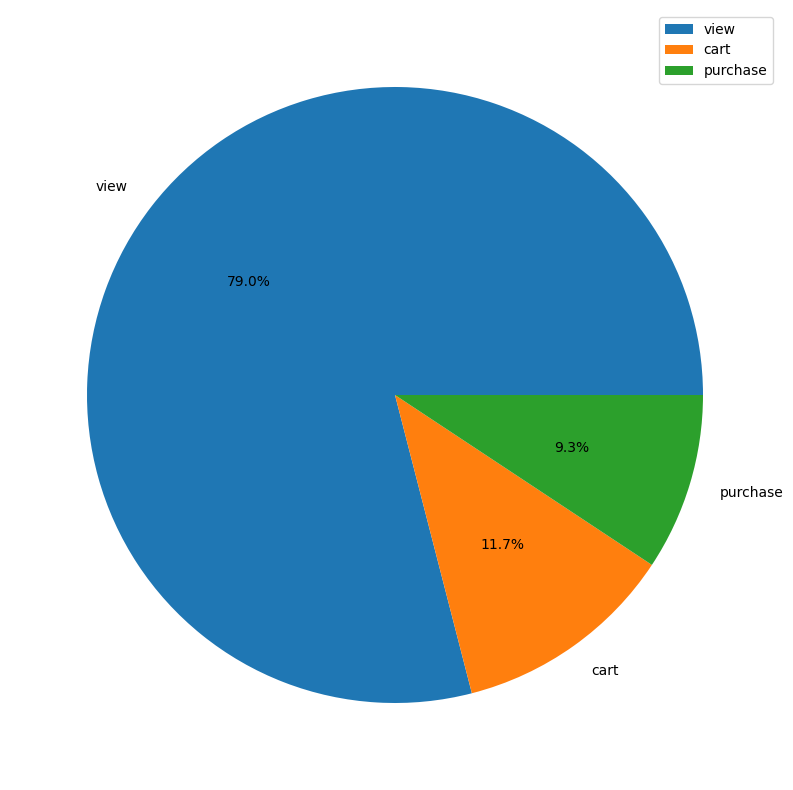

In [32]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
labels = 'view', 'cart', 'purchase'
axes.pie(df_sales["event_type"].value_counts().values, autopct='%1.1f%%', labels = labels)
axes.legend(df_sales["event_type"].value_counts().index)

In [33]:
df_sales.groupby(['brand', 'Category', 'price'])['Sub_category_2'].value_counts()

brand   Category     price    Sub_category_2
acer    accessories  12.07    bag               2
                     25.71    bag               1
                     30.86    bag               3
                     36.01    bag               2
                     77.20    bag               3
                                               ..
yamaha  electronics  2088.78  acoustic          1
                     2187.93  acoustic          1
                     2198.71  acoustic          1
                     2202.86  music_tools       2
                     2249.97  acoustic          2
Name: count, Length: 32753, dtype: int64

In [34]:
df_sales.groupby(['Category', 'price'])['brand'].value_counts()

Category     price   brand 
accessories  6.85    xiaomi    1
             7.11    lenovo    1
             8.52    lenovo    7
             9.01    lenovo    6
                     xiaomi    1
                              ..
stationery   93.30   hp        1
             146.70  canon     1
             147.85  hp        1
             166.00  hp        1
             438.85  hp        1
Name: count, Length: 31086, dtype: int64

In [35]:
#Visualisation
df_sales.groupby(['Day_of_Week']).Category.value_counts().unstack()

Category,accessories,apparel,appliances,auto,computers,construction,country_yard,electronics,furniture,kids,sport,stationery
Day_of_Week,,,,,,,,,,,,
Friday,53,660,7871,278,3163,516,7,27828,718,34,135,9
Monday,41,392,4534,178,1912,339,6,18718,487,25,111,3
Saturday,60,746,8034,255,3117,496,11,27167,842,39,145,6
Sunday,77,658,8268,274,2890,535,7,25503,738,40,120,7
Thursday,47,422,5241,205,2319,363,8,21706,479,31,90,5
Tuesday,52,391,4938,219,2055,350,5,19966,479,26,148,9
Wednesday,46,373,4737,199,2160,343,8,19915,452,25,129,6


In [36]:
df_sales.groupby(['Day_of_Week']).brand.value_counts().unstack()

brand,acer,apple,arg,ariston,artel,asus,atlant,beko,bosch,braun,...,starline,stels,sv,tcl,tefal,thomas,vitek,vivo,xiaomi,yamaha
Day_of_Week,,,,,,,,,,,,,,,,,,,,,
Friday,732,7744,106,117,724,449,151,333,1041,212,...,223,296,272,101,392,74,439,198,5347,69
Monday,467,5203,57,91,417,255,92,222,587,127,...,146,206,170,50,217,29,275,125,3649,42
Saturday,755,7709,113,115,746,442,160,356,1039,217,...,214,308,300,90,430,70,420,221,5117,89
Sunday,679,7265,129,144,660,412,165,339,1111,246,...,233,296,274,89,466,84,455,167,4722,84
Thursday,523,6279,89,101,508,360,94,249,698,157,...,178,202,201,73,243,37,304,125,4102,39
Tuesday,515,5470,79,95,461,296,86,244,662,138,...,185,265,200,44,225,46,297,128,3887,40
Wednesday,524,5508,63,73,449,323,95,239,617,113,...,164,218,205,64,227,39,278,131,3914,37


<Axes: xlabel='Day_of_Week'>

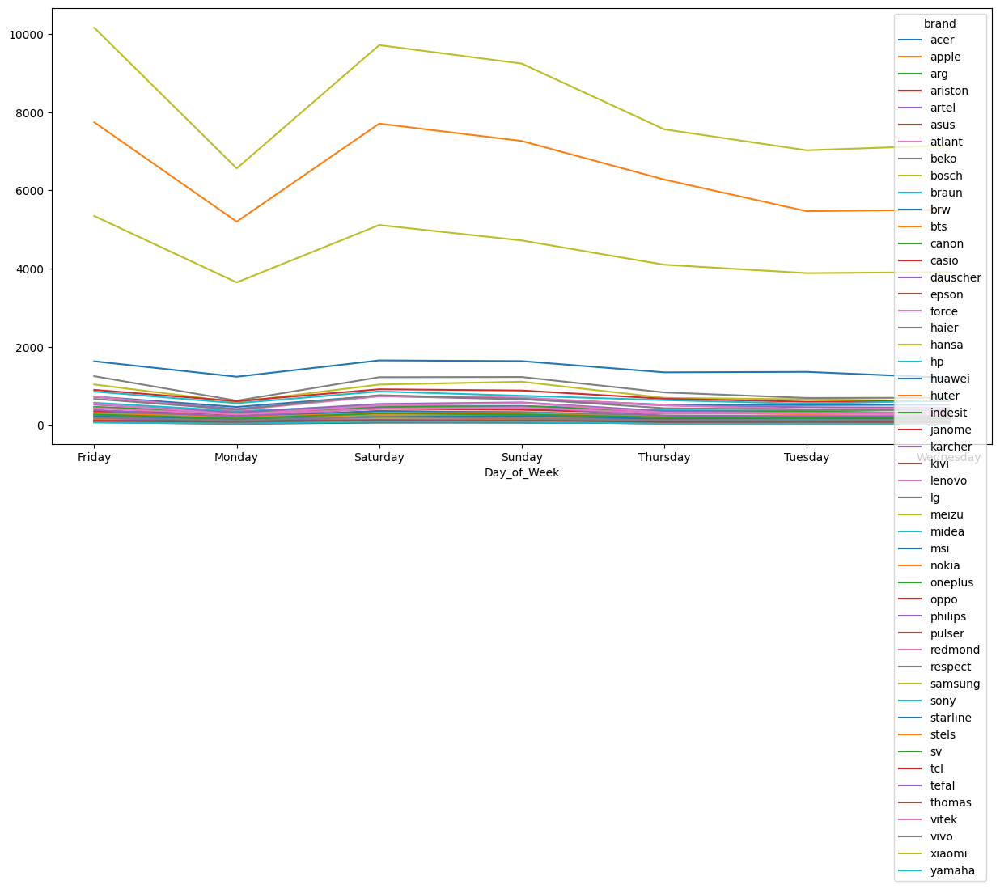

In [37]:
#Insight 2 Day of the week vs Brand - Promotion/ Supply demand analytics
fig, ax = plt.subplots(figsize=(15,7))
df_sales.groupby(['Day_of_Week']).brand.value_counts().unstack().plot(ax=ax)

In [38]:
df_sales.brand.unique()

array(['artel', 'lg', 'philips', 'huawei', 'nokia', 'apple', 'haier',
       'samsung', 'dauscher', 'xiaomi', 'bosch', 'canon', 'sony', 'sv',
       'lenovo', 'tefal', 'oppo', 'acer', 'bts', 'beko', 'vitek',
       'respect', 'ariston', 'vivo', 'asus', 'tcl', 'casio', 'hp',
       'karcher', 'starline', 'indesit', 'redmond', 'janome', 'hansa',
       'pulser', 'midea', 'atlant', 'brw', 'force', 'meizu', 'epson',
       'arg', 'stels', 'huter', 'msi', 'braun', 'yamaha', 'kivi',
       'thomas', 'oneplus'], dtype=object)

In [39]:
brands = ['artel', 'lg', 'philips', 'huawei', 'nokia', 'apple', 'haier',
       'samsung', 'dauscher', 'xiaomi', 'bosch', 'canon', 'sony', 'sv',
       'lenovo', 'tefal', 'oppo', 'acer', 'bts', 'beko', 'vitek',
       'respect', 'ariston', 'vivo', 'asus', 'tcl', 'casio', 'hp',
       'karcher', 'starline', 'indesit', 'redmond', 'janome', 'hansa',
       'pulser', 'midea', 'atlant', 'brw', 'force', 'meizu', 'epson',
       'arg', 'stels', 'huter', 'msi', 'braun', 'yamaha', 'kivi',
       'thomas', 'oneplus']

brands_df = df_sales[df_sales.brand.isin(brands)]
brands_df

,event_type,product_id,category_id,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
0,view,5016,183,artel,36.01,1095536,5342766,2019-10-11,16:57:06,UTC,Friday,appliances,kitchen,oven
1,view,4240,43,lg,2445.08,1153084,4600705,2019-10-27,14:23:53,UTC,Sunday,electronics,video,tv
2,view,7721,208,philips,257.38,364298,5991663,2019-11-25,12:57:47,UTC,Monday,appliances,environment,vacuum
3,view,597,71,huawei,163.20,3536496,9397681,2019-11-12,19:50:55,UTC,Tuesday,electronics,smartphone,smartphone
4,view,13709,70,nokia,21.85,3542250,8711820,2019-11-13,04:59:13,UTC,Wednesday,electronics,telephone,telephone
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235995,cart,16520,91,brw,525.11,350299,566183,2019-11-17,04:43:32,UTC,Sunday,furniture,bedroom,bed
235996,cart,719,71,samsung,298.33,450109,9681143,2019-11-17,16:07:29,UTC,Sunday,electronics,smartphone,smartphone
235997,cart,718,71,samsung,298.07,1516528,3956291,2019-11-17,12:39:00,UTC,Sunday,electronics,smartphone,smartphone
235998,cart,415,71,samsung,94.96,2816015,12343925,2019-11-16,14:02:53,UTC,Saturday,electronics,smartphone,smartphone


<Axes: xlabel='Day_of_Week'>

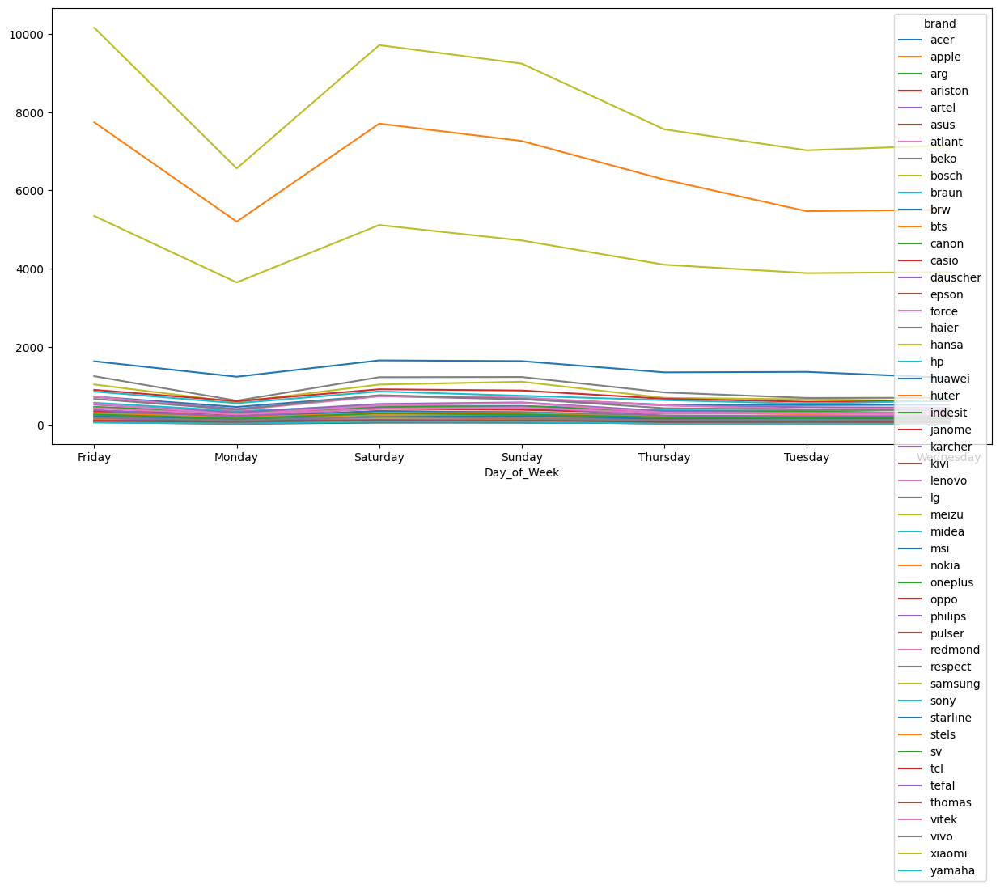

In [40]:
#Total activity(including all 3 view, cart, purchase) per brand for top 5 brands.
fig, ax = plt.subplots(figsize=(15,7))
brands_df.groupby(['Day_of_Week']).brand.value_counts().unstack().plot(ax=ax)

In [41]:
#looking at only the cases where purchases were made
brands_purchases = brands_df[brands_df.event_type.eq('purchase')]
brands_purchases

,event_type,product_id,category_id,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
7,purchase,7462,177,samsung,384.80,2388173,12418114,2019-11-17,08:10:32,UTC,Sunday,appliances,kitchen,washer
11,purchase,51,71,apple,358.57,1589151,148941,2019-10-10,03:30:54,UTC,Thursday,electronics,smartphone,smartphone
210,purchase,7470,177,samsung,386.08,1128145,11855676,2019-10-16,05:16:41,UTC,Wednesday,appliances,kitchen,washer
230,purchase,896,71,apple,1451.85,3926159,13276903,2019-11-25,12:51:14,UTC,Monday,electronics,smartphone,smartphone
262,purchase,11107,26,apple,308.61,3086794,11897800,2019-11-30,04:11:53,UTC,Saturday,electronics,clocks,clocks
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217995,purchase,445,71,apple,763.92,2254635,236068,2019-10-16,11:17:09,UTC,Wednesday,electronics,smartphone,smartphone
217996,purchase,10566,50,apple,165.84,3193793,12513942,2019-11-20,04:11:33,UTC,Wednesday,electronics,audio,headphone
217997,purchase,11188,27,xiaomi,28.42,2621269,8539102,2019-10-13,08:44:03,UTC,Sunday,electronics,smartphone,smartphone
217998,purchase,7186,177,samsung,334.60,842753,476371,2019-10-12,02:18:45,UTC,Saturday,appliances,kitchen,washer


In [42]:
brands_purchases.groupby(['Day_of_Week']).brand.value_counts().unstack()

brand,acer,apple,arg,ariston,artel,asus,atlant,beko,bosch,braun,...,starline,stels,sv,tcl,tefal,thomas,vitek,vivo,xiaomi,yamaha
Day_of_Week,,,,,,,,,,,,,,,,,,,,,
Friday,34.0,797.0,5.0,4.0,36.0,9.0,6.0,19.0,33.0,4.0,...,7.0,18.0,8.0,2.0,22.0,NaN,21.0,10.0,291.0,5.0
Monday,32.0,714.0,4.0,7.0,32.0,8.0,8.0,16.0,23.0,9.0,...,12.0,18.0,4.0,2.0,13.0,1.0,16.0,10.0,284.0,3.0
Saturday,45.0,938.0,9.0,5.0,52.0,13.0,3.0,26.0,30.0,9.0,...,17.0,14.0,11.0,3.0,21.0,4.0,31.0,16.0,379.0,3.0
Sunday,55.0,1295.0,13.0,25.0,56.0,24.0,13.0,41.0,68.0,31.0,...,25.0,22.0,14.0,12.0,50.0,11.0,40.0,18.0,495.0,7.0
Thursday,38.0,736.0,11.0,5.0,44.0,14.0,4.0,16.0,22.0,10.0,...,15.0,11.0,5.0,12.0,12.0,NaN,17.0,7.0,277.0,2.0
Tuesday,20.0,812.0,15.0,10.0,42.0,11.0,1.0,24.0,41.0,5.0,...,6.0,15.0,2.0,3.0,14.0,1.0,15.0,7.0,306.0,3.0
Wednesday,31.0,758.0,3.0,5.0,40.0,12.0,3.0,17.0,27.0,6.0,...,8.0,10.0,6.0,5.0,10.0,1.0,27.0,7.0,318.0,2.0


<Axes: xlabel='Day_of_Week'>

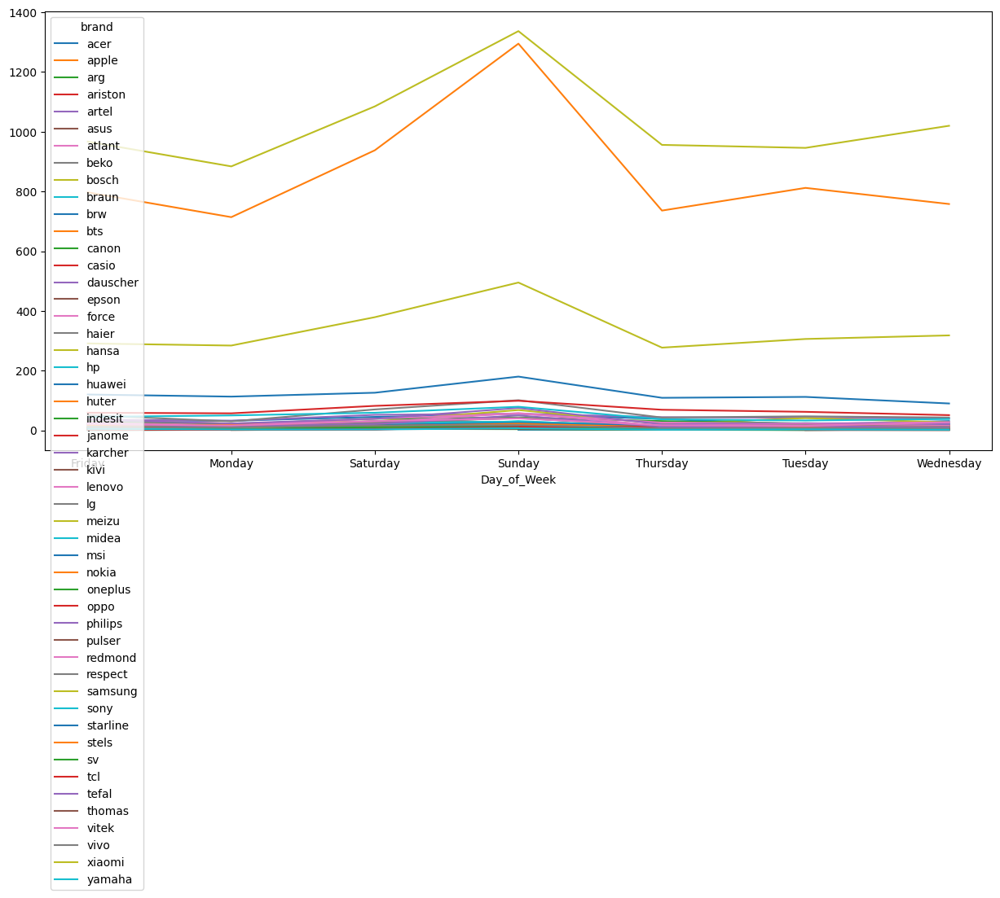

In [43]:
#Total activity(including all 3 view, cart, purchase) per brand for top 5 brands.
fig, ax = plt.subplots(figsize=(15,7))
brands_purchases.groupby(['Day_of_Week']).brand.value_counts().unstack().plot(ax=ax)

In [44]:
brand_avgPrice = brands_df.groupby(['brand']).price.mean()
brand_avgPrice

,price
brand,
acer,607.488901
apple,815.468169
arg,124.568239
ariston,146.421739
artel,173.329508
asus,627.247674
atlant,270.510368
beko,257.345545
bosch,266.649308


In [45]:
brand_revenue = brands_purchases.groupby(['brand']).price.sum()
brand_revenue

,price
brand,
acer,131078.20
apple,4658923.54
arg,6241.77
ariston,7111.48
artel,48754.28
asus,49142.35
atlant,9990.03
beko,37573.58
bosch,48739.95


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49],
 [Text(0, 0, 'artel'),
  Text(1, 0, 'lg'),
  Text(2, 0, 'philips'),
  Text(3, 0, 'huawei'),
  Text(4, 0, 'nokia'),
  Text(5, 0, 'apple'),
  Text(6, 0, 'haier'),
  Text(7, 0, 'samsung'),
  Text(8, 0, 'dauscher'),
  Text(9, 0, 'xiaomi'),
  Text(10, 0, 'bosch'),
  Text(11, 0, 'canon'),
  Text(12, 0, 'sony'),
  Text(13, 0, 'sv'),
  Text(14, 0, 'lenovo'),
  Text(15, 0, 'tefal'),
  Text(16, 0, 'oppo'),
  Text(17, 0, 'acer'),
  Text(18, 0, 'bts'),
  Text(19, 0, 'beko'),
  Text(20, 0, 'vitek'),
  Text(21, 0, 'respect'),
  Text(22, 0, 'ariston'),
  Text(23, 0, 'vivo'),
  Text(24, 0, 'asus'),
  Text(25, 0, 'tcl'),
  Text(26, 0, 'casio'),
  Text(27, 0, 'hp'),
  Text(28, 0, 'karcher'),
  Text(29, 0, 'starline'),

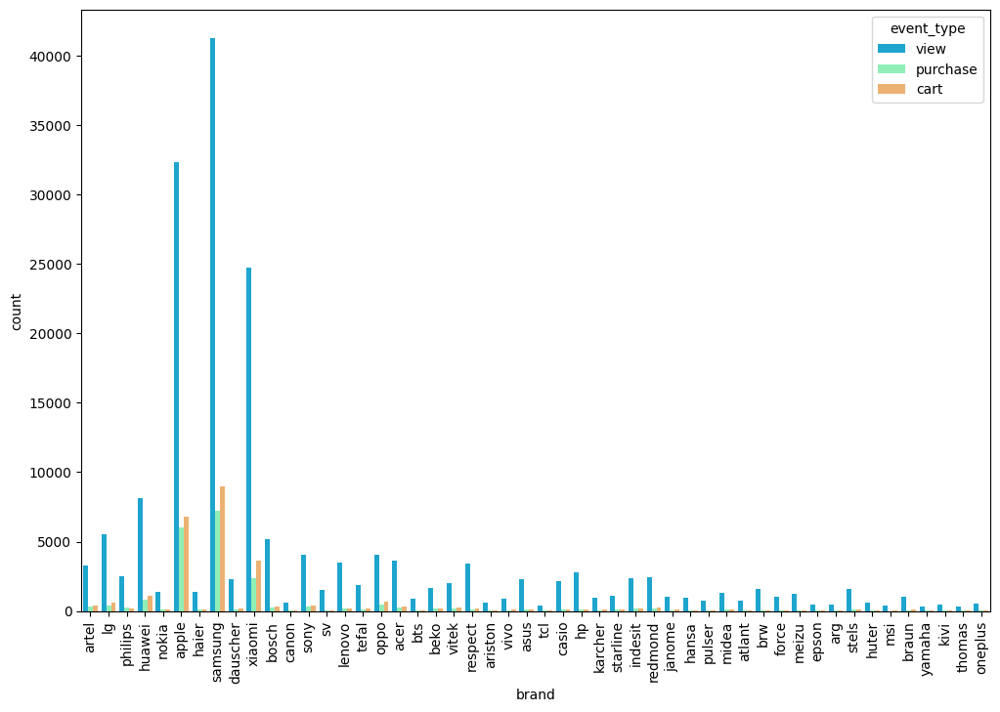

In [46]:
plt.figure(figsize=(12,8))
sns.countplot(x='brand', hue='event_type',data=brands_df, palette="rainbow")
plt.xticks(rotation=90)

In [47]:
#Brand vs Price for pricing
#looking at only the cases where purchases were made
Category_sales = df_sales[df_sales.event_type.eq('purchase')]
Category_sales

,event_type,product_id,category_id,brand,price,user_id,user_session,Event_date,Event_time,Event_timezone,Day_of_Week,Category,Sub_category_1,Sub_category_2
7,purchase,7462,177,samsung,384.80,2388173,12418114,2019-11-17,08:10:32,UTC,Sunday,appliances,kitchen,washer
11,purchase,51,71,apple,358.57,1589151,148941,2019-10-10,03:30:54,UTC,Thursday,electronics,smartphone,smartphone
210,purchase,7470,177,samsung,386.08,1128145,11855676,2019-10-16,05:16:41,UTC,Wednesday,appliances,kitchen,washer
230,purchase,896,71,apple,1451.85,3926159,13276903,2019-11-25,12:51:14,UTC,Monday,electronics,smartphone,smartphone
262,purchase,11107,26,apple,308.61,3086794,11897800,2019-11-30,04:11:53,UTC,Saturday,electronics,clocks,clocks
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217995,purchase,445,71,apple,763.92,2254635,236068,2019-10-16,11:17:09,UTC,Wednesday,electronics,smartphone,smartphone
217996,purchase,10566,50,apple,165.84,3193793,12513942,2019-11-20,04:11:33,UTC,Wednesday,electronics,audio,headphone
217997,purchase,11188,27,xiaomi,28.42,2621269,8539102,2019-10-13,08:44:03,UTC,Sunday,electronics,smartphone,smartphone
217998,purchase,7186,177,samsung,334.60,842753,476371,2019-10-12,02:18:45,UTC,Saturday,appliances,kitchen,washer
